In [1]:
import folium
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import seaborn as sns

# Load Data

In [2]:
data = pd.read_csv(
    "../data/tree_data/2015-street-tree-census-tree-data.csv",
    parse_dates=["created_at"],
    index_col="tree_id",
)

In [3]:
data.head()

,Unnamed: 0,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,...,boro_ct,state,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
tree_id,,,,,,,,,,,,,,,,,,,,,
221864,19575,107688,2015-09-13,11,0,OnCurb,Alive,Poor,Pyrus calleryana,Callery pear,...,1013600,New York,40.773402,-73.947079,9.989077e+05,221052.5156,5.0,136.0,1051194.0,1.015800e+09
328163,172248,213992,2015-10-14,9,0,OnCurb,Alive,Good,Quercus bicolor,swamp white oak,...,3072600,New York,40.631616,-73.933963,1.002579e+06,169398.2032,45.0,726.0,3214207.0,3.077480e+09
690511,483212,214423,2016-08-31,25,0,OnCurb,Alive,Good,Platanus x acerifolia,London planetree,...,3095600,New York,40.635410,-73.909161,1.009462e+06,170786.3448,46.0,956.0,3225006.0,3.080200e+09
290017,103200,349008,2015-10-06,7,0,OnCurb,Alive,Good,Quercus palustris,pin oak,...,4071303,New York,40.728232,-73.849770,1.025888e+06,204626.9553,29.0,71303.0,4051256.0,4.021340e+09
40867,557989,108216,2015-06-29,10,0,OnCurb,Alive,Good,Styphnolobium japonicum,Sophora,...,1016001,New York,40.785596,-73.953476,9.971335e+05,225494.2784,4.0,16001.0,1047404.0,1.015060e+09


# Data info

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10000 entries, 221864 to 612369
Data columns (total 45 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Unnamed: 0        10000 non-null  int64         
 1   block_id          10000 non-null  int64         
 2   created_at        10000 non-null  datetime64[ns]
 3   tree_dbh          10000 non-null  int64         
 4   stump_diam        10000 non-null  int64         
 5   curb_loc          10000 non-null  object        
 6   status            10000 non-null  object        
 7   health            9545 non-null   object        
 8   spc_latin         9545 non-null   object        
 9   spc_common        9545 non-null   object        
 10  steward           2474 non-null   object        
 11  guards            1209 non-null   object        
 12  sidewalk          9545 non-null   object        
 13  user_type         10000 non-null  object        
 14  problems          330

# Missing values pie chart

In [5]:
missing_values_df = pd.DataFrame(data.isnull().mean() * 100, columns=["percantage"])
missing_values_df = missing_values_df[missing_values_df["percantage"] > 0]
missing_values_df

,percantage
health,4.55
spc_latin,4.55
spc_common,4.55
steward,75.26
guards,87.91
sidewalk,4.55
problems,66.95
council district,0.98
census tract,0.98
bin,1.29


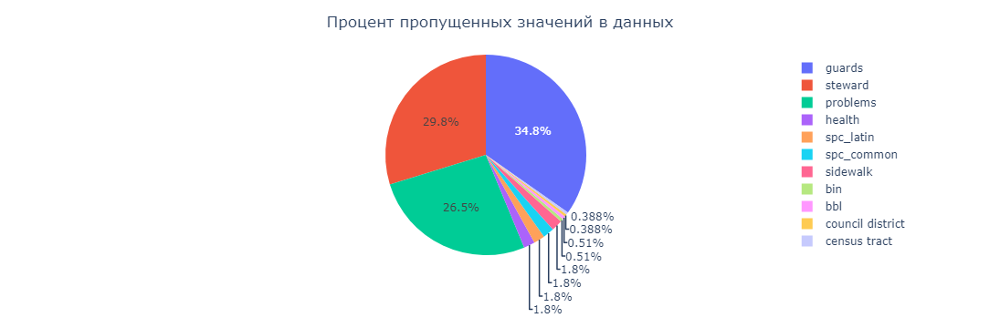

In [6]:
fig = px.pie(missing_values_df, values="percantage", names=missing_values_df.index)
fig.update_layout(title="Процент пропущенных значений в данных", title_x=0.5)
fig.show()

# features pairplot

In [7]:
data.head()

,Unnamed: 0,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,...,boro_ct,state,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
tree_id,,,,,,,,,,,,,,,,,,,,,
221864,19575,107688,2015-09-13,11,0,OnCurb,Alive,Poor,Pyrus calleryana,Callery pear,...,1013600,New York,40.773402,-73.947079,9.989077e+05,221052.5156,5.0,136.0,1051194.0,1.015800e+09
328163,172248,213992,2015-10-14,9,0,OnCurb,Alive,Good,Quercus bicolor,swamp white oak,...,3072600,New York,40.631616,-73.933963,1.002579e+06,169398.2032,45.0,726.0,3214207.0,3.077480e+09
690511,483212,214423,2016-08-31,25,0,OnCurb,Alive,Good,Platanus x acerifolia,London planetree,...,3095600,New York,40.635410,-73.909161,1.009462e+06,170786.3448,46.0,956.0,3225006.0,3.080200e+09
290017,103200,349008,2015-10-06,7,0,OnCurb,Alive,Good,Quercus palustris,pin oak,...,4071303,New York,40.728232,-73.849770,1.025888e+06,204626.9553,29.0,71303.0,4051256.0,4.021340e+09
40867,557989,108216,2015-06-29,10,0,OnCurb,Alive,Good,Styphnolobium japonicum,Sophora,...,1016001,New York,40.785596,-73.953476,9.971335e+05,225494.2784,4.0,16001.0,1047404.0,1.015060e+09


In [8]:
data_sample = data.sample(n=50000, replace=True, random_state=42)

In [9]:
num_cols = data_sample.select_dtypes(exclude="object").columns.to_list()
num_cols

['Unnamed: 0',
 'block_id',
 'created_at',
 'tree_dbh',
 'stump_diam',
 'postcode',
 'community board',
 'borocode',
 'cncldist',
 'st_assem',
 'st_senate',
 'boro_ct',
 'latitude',
 'longitude',
 'x_sp',
 'y_sp',
 'council district',
 'census tract',
 'bin',
 'bbl']

In [10]:
data_sample = data_sample.drop_duplicates()

In [11]:
data_sample.duplicated().sum()

0

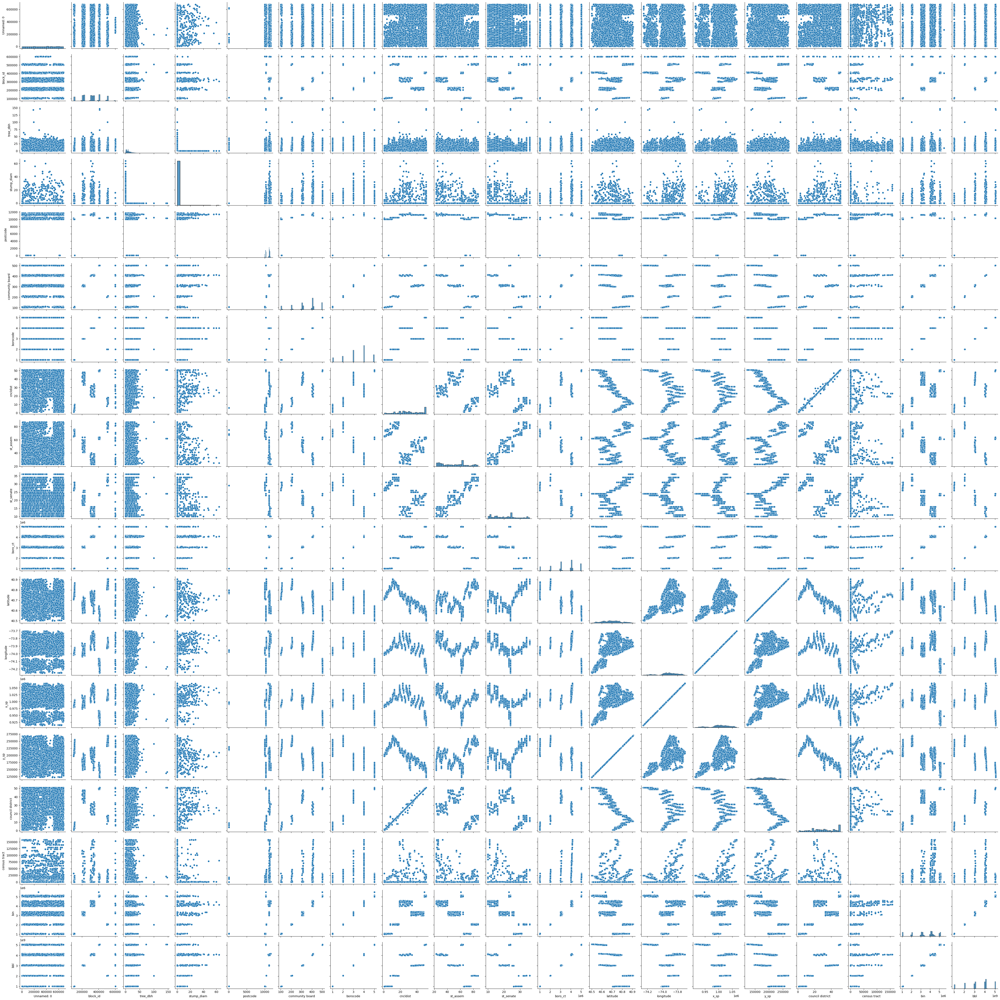

In [12]:
sns.pairplot(data_sample[num_cols])

# Correlation data

<Axes: >

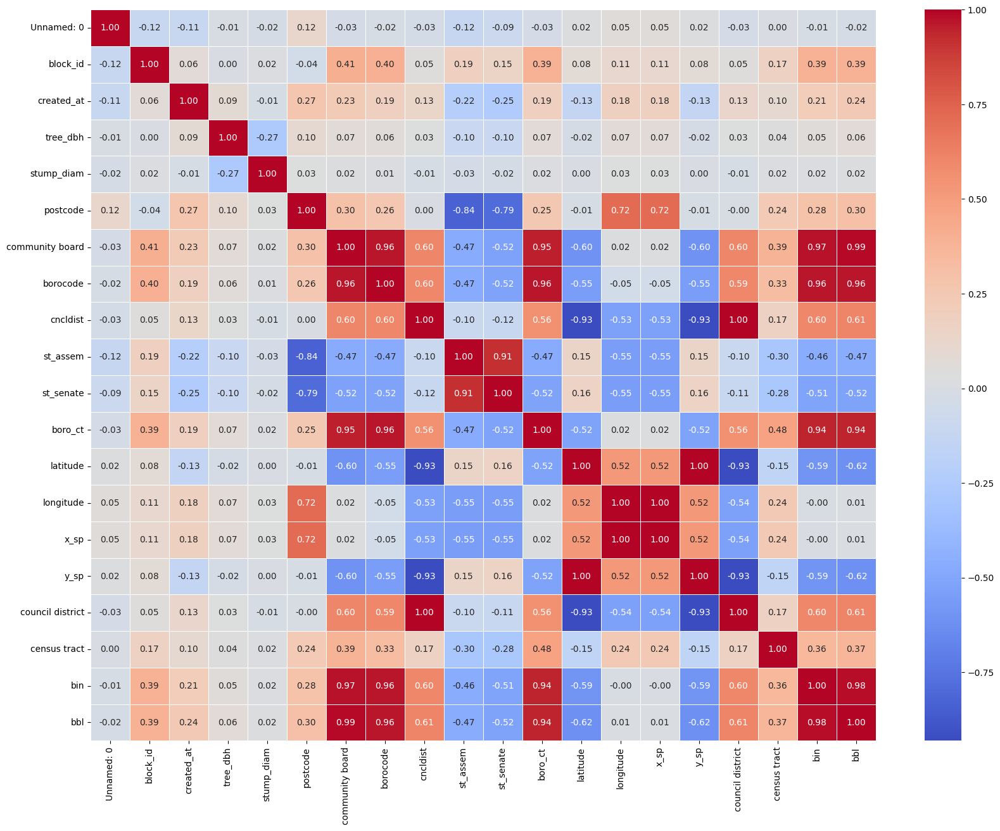

In [13]:
plt.figure(figsize=(20, 15))
sns.heatmap(
    data_sample[num_cols].corr(method="spearman"),
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    linewidths=0.5,
)

# Tree mapping

In [14]:
# Make an empty map
m = folium.Map(location=[20, 0], tiles="OpenStreetMap", zoom_start=2)

In [17]:
import random

random_start = random.randint(0, 10000)
for i in range(0, 1000):
    folium.Marker(
        location=[data_sample.iloc[i]["latitude"], data_sample.iloc[i]["longitude"]],
        popup=data.iloc[i]["spc_latin"],
    ).add_to(m)

In [18]:
m